# BSD68 Denoising Dataset

In [1]:
import os

current_dir = os.getcwd()
print("Current directory:", current_dir)

Current directory: /home/mkang2/Convolutional-Nearest-Neighbor/Testing


In [2]:
# Torch
import torch 
import torch.nn as nn
import torch.nn.functional as F
from torch import optim 
from torchsummary import summary
from torchvision.transforms import v2
import numpy as np


# Train + Data 
import sys 
sys.path.append('../Layers')
from Conv1d_NN import *
from Conv2d_NN import *
from Conv1d_NN_spatial import * 

from Conv2d_NN_spatial import * 
from ConvNN_CNN_Branching import *

sys.path.append('../Data')
from BSD68 import NoisyBSD68_dataset, test_denoise_visual_BSD


sys.path.append('../Models')
from denoising_models import DenoisingCNN, DenoisingBranching_ConvNN_2D_Spatial_K_N, DenoisingBranching_ConvNN_2D_K_N, DenoisingConvNN_2D_K_N

sys.path.append('../Train')
from train2d import train_denoising_model, evaluate_denoising_accuracy, evaluate_accuracy_psnr


import numpy as np


In [3]:
noisybsd68 = NoisyBSD68_dataset(batch_size=32, noise_std=0.3, train_count=1000, test_count=200, target_size=256)

In [4]:
print(len(noisybsd68.train_data))
print(len(noisybsd68.test_data))
print(len(noisybsd68.test_data[0]))
print(noisybsd68.train_data[0][0].shape)


1000
200
3
torch.Size([1, 256, 256])


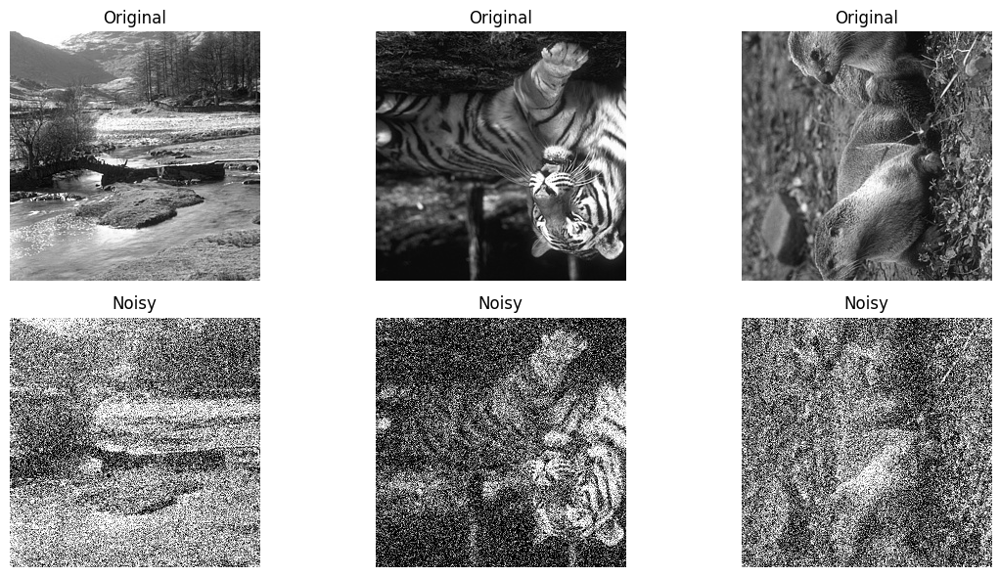

In [5]:
noisybsd68.visual(3)

### Control CNN Model



Epoch 1, Time: 1.2221448421478271, Loss: 0.11592010303866118
Epoch 2, Time: 0.9659230709075928, Loss: 0.018425018643029034
Epoch 3, Time: 0.9831783771514893, Loss: 0.011127569916425273
Epoch 4, Time: 0.9695162773132324, Loss: 0.009277021483285353
Epoch 5, Time: 0.9823787212371826, Loss: 0.009041849261848256
Epoch 6, Time: 1.0166101455688477, Loss: 0.008910346223274246
Epoch 7, Time: 1.005293607711792, Loss: 0.008740956312976778
Epoch 8, Time: 1.0000433921813965, Loss: 0.0087047912820708
Epoch 9, Time: 0.9745669364929199, Loss: 0.008529418089892715
Epoch 10, Time: 0.9627127647399902, Loss: 0.008416230091825128

 Average epoch time: 1.008236813545227
Average loss on test set: 0.008302664051630668
Average PSNR on test set: 20.8023259299142


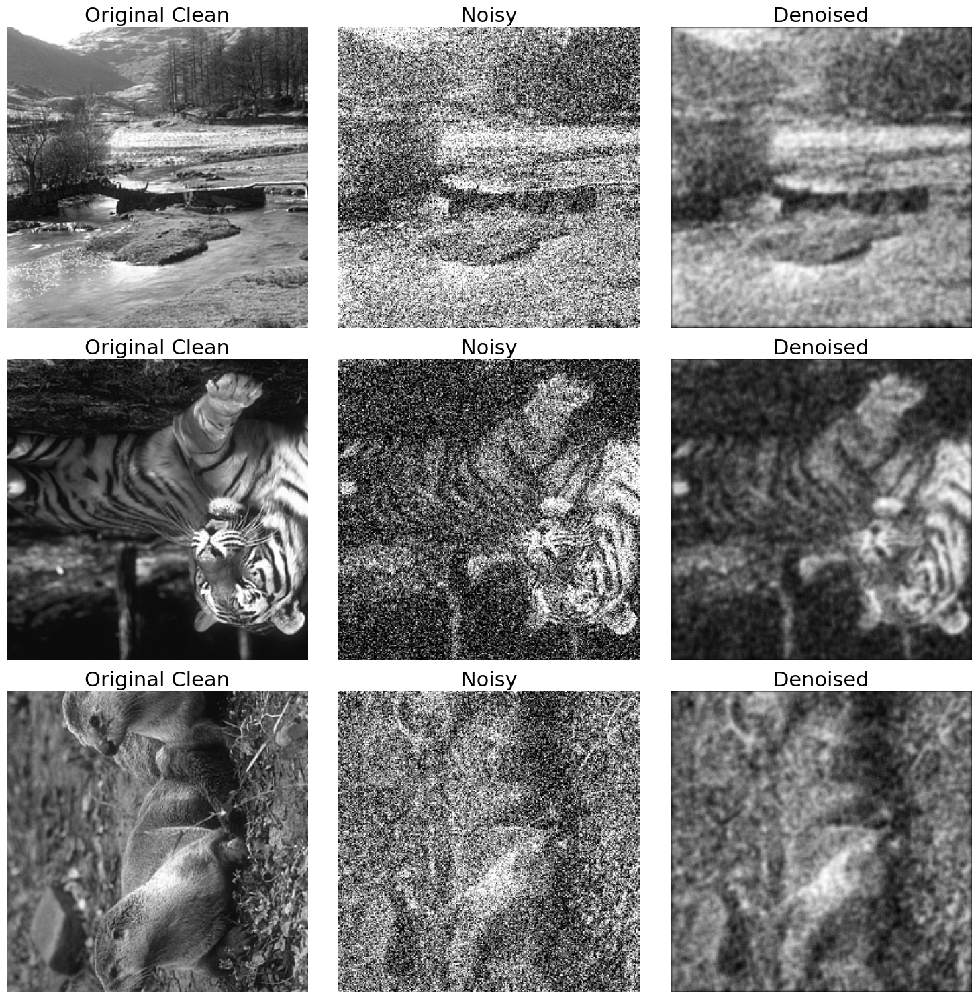

In [6]:
# CNN control model 
CNN = DenoisingCNN(in_ch=1, out_ch=1, kernel_size=3, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(CNN.parameters(), lr=0.001)
num_epochs = 10
train_denoising_model(CNN, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(CNN, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(CNN, noisybsd68.test_loader, criterion, device='cuda')


# Print out output of trained model
test_denoise_visual_BSD(CNN, noisybsd68.test_data, device='cuda')


## Branching Model

Epoch 1, Time: 7.543833017349243, Loss: 0.05990357662085444
Epoch 2, Time: 7.522231101989746, Loss: 0.011532617849297822
Epoch 3, Time: 7.547698497772217, Loss: 0.009010803245473653
Epoch 4, Time: 7.524463176727295, Loss: 0.008704587497049943
Epoch 5, Time: 7.522643089294434, Loss: 0.008467958396067843
Epoch 6, Time: 7.532296180725098, Loss: 0.008346880887984298
Epoch 7, Time: 7.532164573669434, Loss: 0.008205507081584074
Epoch 8, Time: 7.533975124359131, Loss: 0.007996883388841525
Epoch 9, Time: 7.558621883392334, Loss: 0.007839293233701028
Epoch 10, Time: 7.5267932415008545, Loss: 0.0076672719296766445

 Average epoch time: 7.5344719886779785
Average loss on test set: 0.007723976924483266
Average PSNR on test set: 21.15471867152623


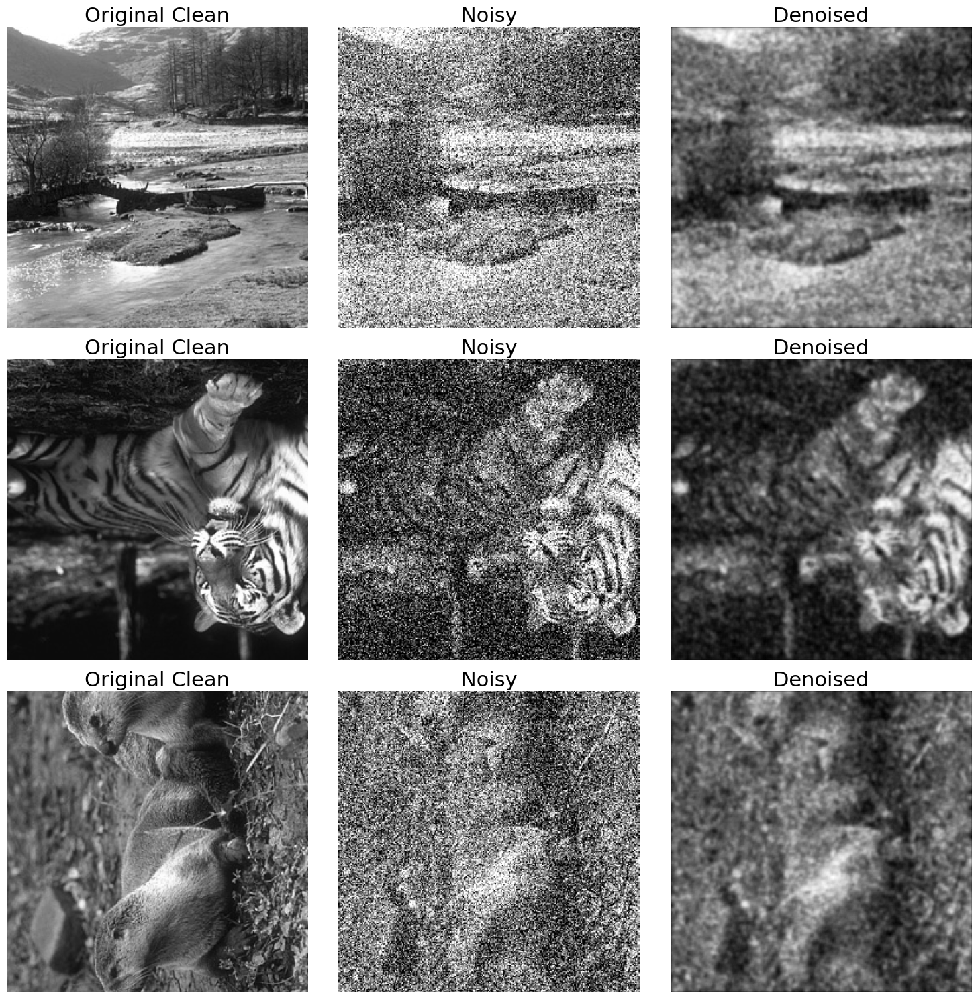

In [10]:
# Denoising Branching CNN + ConvNN Spatial, K = 9, N = 22 (484), 16:16
denoisingbranching_convNN_spatial_K_N_16_16 = DenoisingBranching_ConvNN_2D_Spatial_K_N(in_ch=1, out_ch=1, K=9, N=22, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoisingbranching_convNN_spatial_K_N_16_16.parameters(), lr=0.001)
num_epochs = 10
train_denoising_model(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoisingbranching_convNN_spatial_K_N_16_16, noisybsd68.test_data, device='cuda')


## ERROR spatial branching is not working now -> figure out why



Epoch 1, Time: 7.1618053913116455, Loss: 0.03325808281078935
Epoch 2, Time: 7.166277170181274, Loss: 0.017690396634861827
Epoch 3, Time: 7.169170141220093, Loss: 0.014704903704114258
Epoch 4, Time: 7.180722713470459, Loss: 0.012553066713735461
Epoch 5, Time: 7.150377035140991, Loss: 0.011416355497203767
Epoch 6, Time: 7.142731666564941, Loss: 0.010509917046874762
Epoch 7, Time: 7.150262355804443, Loss: 0.00974449681234546
Epoch 8, Time: 7.171804666519165, Loss: 0.009265819506254047
Epoch 9, Time: 7.156073570251465, Loss: 0.008888363983714953
Epoch 10, Time: 7.133696794509888, Loss: 0.00858298059029039

 Average epoch time: 7.158292150497436
Average loss on test set: 0.00884093064814806
Average PSNR on test set: 20.73024640764509


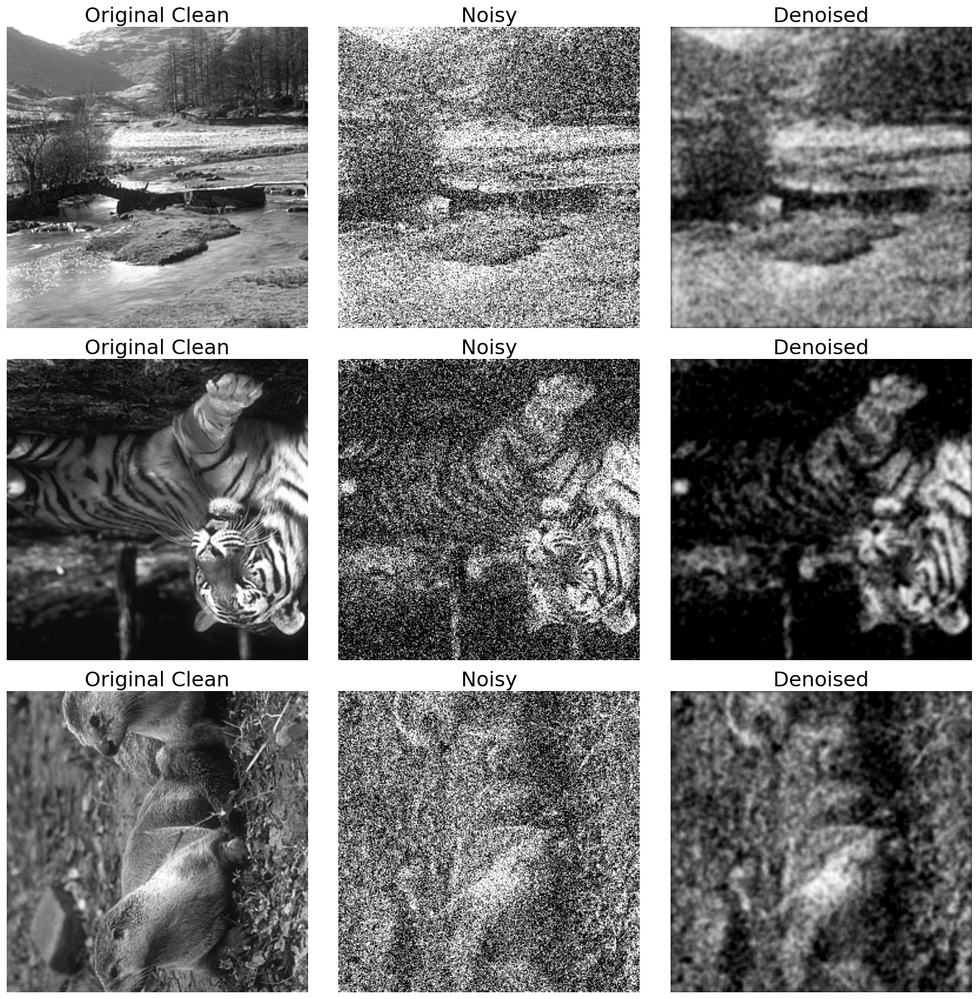

In [8]:
# Denoising Branching CNN + ConvNN , K = 9, N = 484, 16:16
denoisingbranching_convNN_K_N_16_16 = DenoisingBranching_ConvNN_2D_K_N(in_ch=1, out_ch=1, K=9, N=484, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoisingbranching_convNN_K_N_16_16.parameters(), lr=0.001)
num_epochs = 10 
train_denoising_model(denoisingbranching_convNN_K_N_16_16, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoisingbranching_convNN_K_N_16_16, noisybsd68.test_data, device='cuda')



Epoch 1, Time: 6.705272436141968, Loss: 0.04518961167195812
Epoch 2, Time: 6.680387735366821, Loss: 0.027137817931361496
Epoch 3, Time: 6.660174131393433, Loss: 0.023807827208656818
Epoch 4, Time: 6.676189661026001, Loss: 0.021855276660062373
Epoch 5, Time: 6.675145626068115, Loss: 0.02020284318132326
Epoch 6, Time: 6.685718297958374, Loss: 0.018904243304859847
Epoch 7, Time: 6.679542064666748, Loss: 0.018667426600586623
Epoch 8, Time: 6.672193288803101, Loss: 0.018191306211519986
Epoch 9, Time: 6.657027721405029, Loss: 0.017607069108635187
Epoch 10, Time: 6.668228626251221, Loss: 0.017602369392989203

 Average epoch time: 6.675987958908081
Average loss on test set: 0.01741534285247326
Average PSNR on test set: 17.568483080182755


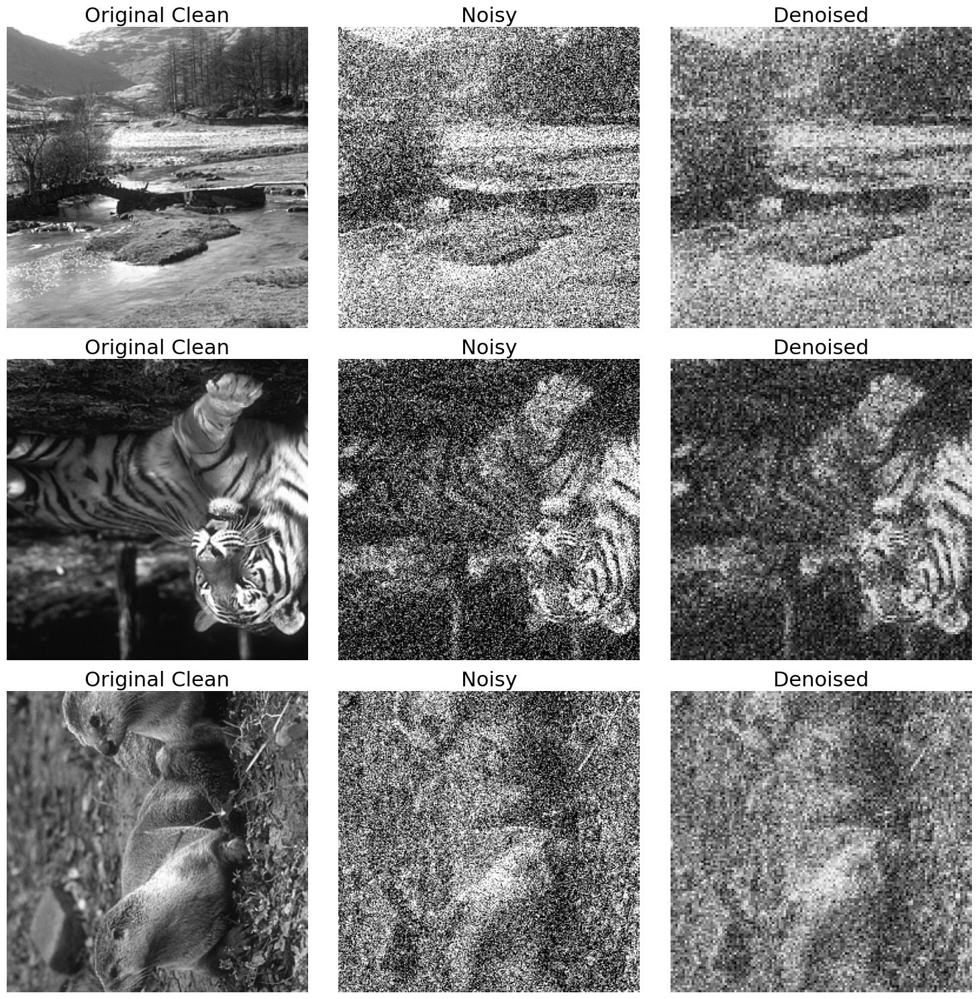

In [9]:
# ConvNN K = 9, N = 484
denoising_convNN_2D_K_N = DenoisingConvNN_2D_K_N(in_ch=1, out_ch=1, K=9, N=484, device='cuda')

criterion = nn.MSELoss()
optimizer = optim.Adam(denoising_convNN_2D_K_N.parameters(), lr=0.001)
num_epochs = 10 
train_denoising_model(denoising_convNN_2D_K_N, noisybsd68.train_loader, criterion, optimizer, num_epochs, device='cuda')
evaluate_denoising_accuracy(denoising_convNN_2D_K_N, noisybsd68.test_loader, criterion, device='cuda')
evaluate_accuracy_psnr(denoising_convNN_2D_K_N, noisybsd68.test_loader, criterion, device='cuda')

# Print out output of trained model
test_denoise_visual_BSD(denoising_convNN_2D_K_N, noisybsd68.test_data, device='cuda')

